# PAPNet

## 1. Setup

Define the desired repository path to be. This is where the `pointcloud-bench` project repository is cloned

In [15]:
REPO_PATH = "/content/pointcloud-bench"

### 1.1 Clone the working repository

In [16]:
!git clone --recursive --branch main https://github.com/DavidClaszen/pointcloud-bench {REPO_PATH}

Cloning into '/content/pointcloud-bench'...
remote: Enumerating objects: 637, done.
remote: Counting objects: 100% (185/185), done.
remote: Compressing objects: 100% (142/142), done.
remote: Total 637 (delta 81), reused 120 (delta 43), pack-reused 452 (from 2)
Receiving objects: 100% (637/637), 52.83 MiB | 23.08 MiB/s, done.
Resolving deltas: 100% (273/273), done.
Submodule 'repos/PAPNet' (https://github.com/DavidClaszen/PAPNet.git) registered for path 'repos/PAPNet'
Submodule 'repos/Point-Transformers' (https://github.com/DavidClaszen/Point-Transformers.git) registered for path 'repos/Point-Transformers'
Cloning into '/content/pointcloud-bench/repos/PAPNet'...
remote: Enumerating objects: 145, done.        
remote: Counting objects: 100% (145/145), done.        
remote: Compressing objects: 100% (117/117), done.        
remote: Total 145 (delta 63), reused 88 (delta 27), pack-reused 0 (from 0)        
Receiving objects: 100% (145/145), 9.66 MiB | 9.93 MiB/s, done.
Resolving deltas: 10

`cd` to the repo then pull the latest changes to the repository (for rolling changes)

In [ ]:
%cd {REPO_PATH}
!git checkout papnet-occlusion
!git pull origin
!git submodule update --recursive

/content/pointcloud-bench
M	repos/PAPNet
M	repos/Point-Transformers
Branch 'papnet-occlusion' set up to track remote branch 'papnet-occlusion' from 'origin'.
Switched to a new branch 'papnet-occlusion'
Already up to date.
Submodule path 'repos/PAPNet': checked out '3b0befd579a350d6ca16dbdd7cf37e533bd444ac'
Submodule path 'repos/Point-Transformers': checked out 'f7dac3faee896c7dff6e61bfca7c79b914f96abd'


### 1.2 Mount the dataset from Google Drive

In [ ]:
import os
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


Inside the dataset folder, we expect the presence of three files:
- partialmodelnet40.tar.gz
- fullmodelnet40.tar

In [17]:
# Define the path to the dataset in Google Drive where the data and models are saved
# The folder must contain the following files:
# - partialmodelnet40.tar.gz
# - fullmodelnet40.tar.gz
# - pm40_extreme_partiality.tar.gz
datasets_folder_path = '/content/drive/MyDrive/_Temp/cs7643-final-proj/pointcloud-bench/datasets'
output_path = '/content/drive/MyDrive/_Temp/cs7643-final-proj/pointcloud-bench/results'
checkpoints_folder_path = '/content/drive/MyDrive/_Temp/cs7643-final-proj/pointcloud-bench/checkpoints'

# Check contents to make sure it's there
file_exists = lambda path: os.path.exists(path)
folder_exists = lambda path: os.path.isdir(path)
print("partialmodelnet40: ", "OK" if file_exists(os.path.join(datasets_folder_path, 'partialmodelnet40.tar.gz')) else "NOT FOUND")
print("fullmodelnet40: ", "OK" if file_exists(os.path.join(datasets_folder_path, 'fullmodelnet40.tar.gz')) else "NOT FOUND")
print("pm40_extreme_partiality: ", "OK" if file_exists(os.path.join(datasets_folder_path, 'pm40_extreme_partiality.tar.gz')) else "NOT FOUND")
print("models: ", "OK" if folder_exists(checkpoints_folder_path) else "NOT FOUND")

partialmodelnet40:  OK
fullmodelnet40:  OK
pm40_extreme_partiality:  OK
models:  OK


### 1.2 Install Requirements

In [ ]:
%pip install -r envs/papnet/requirements.txt  --no-deps

Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu126
  Cloning https://github.com/AMLab-Amsterdam/lie_learn (to revision master) to /tmp/pip-install-7zdggrjo/lie-learn_00bd99c3d2d043a38072f41e44a961d5
  Running command git clone --filter=blob:none --quiet https://github.com/AMLab-Amsterdam/lie_learn /tmp/pip-install-7zdggrjo/lie-learn_00bd99c3d2d043a38072f41e44a961d5
  Resolved https://github.com/AMLab-Amsterdam/lie_learn to commit edf012f5f60af320175d2e6269db78b984b5bfc3
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 37.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 10.9 MB/s eta 0:00:00
  Created wheel for lie_learn: filename=lie_learn-0.0.2-cp312-cp312-linux_x86_64.whl size=16619315 sha256=c623ee8b58376ea8adfc5d184998c19961c4b6a17ddf53ac0b2f404f9e6ca777
  Stored in directory: /tmp/pi

### 1.3 Copy and extract the data and models to local working directory

In [19]:
# Copy select files from Google Drive to the repo dataset folder
!mkdir /content/downloads
!rsync -avP {datasets_folder_path}/partialmodelnet40.tar.gz /content/downloads
!rsync -avP {datasets_folder_path}/fullmodelnet40.tar.gz /content/downloads
!rsync -avP {datasets_folder_path}/pm40_extreme_partiality.tar.gz /content/downloads


mkdir: cannot create directory ‘/content/downloads’: File exists
sending incremental file list
partialmodelnet40.tar.gz
  2,162,130,396 100%   63.50MB/s    0:00:32 (xfr#1, to-chk=0/1)

sent 2,162,658,366 bytes  received 35 bytes  64,556,967.19 bytes/sec
total size is 2,162,130,396  speedup is 1.00


In [ ]:
# Copy the models
!rsync -avP {checkpoints_folder_path}/papnet*.pth {REPO_PATH}/repos/PAPNet/trained_models/

sending incremental file list

sent 116 bytes  received 12 bytes  256.00 bytes/sec
total size is 23,874,830  speedup is 186,522.11


In [20]:
# Extract zip file
%cd {REPO_PATH}
!tar -xvzf /content/downloads/partialmodelnet40.tar.gz -C {REPO_PATH}/datasets
!tar -xvzf /content/downloads/fullmodelnet40.tar.gz -C {REPO_PATH}/datasets
!tar -xvzf /content/downloads/pm40_extreme_partiality.tar.gz -C {REPO_PATH}/datasets

/content/pointcloud-bench
partialmodelnet40/
partialmodelnet40/test_labels.npy
partialmodelnet40/test_gt_tra.npy
partialmodelnet40/test_gt_rot.npy
partialmodelnet40/partialmodelnet40_shape_names.txt
partialmodelnet40/partialmodelnet40_test.txt
partialmodelnet40/partialmodelnet40_train.txt
partialmodelnet40/train_points.npy
partialmodelnet40/train_labels.npy
partialmodelnet40/train_gt_tra.npy
partialmodelnet40/train_gt_rot.npy
partialmodelnet40/test_points.npy


In [ ]:
import os
import pickle

# Ensure the results directory exists
pickle_save_path = os.path.join(output_path, "accuracy_papnet")
os.makedirs(pickle_save_path, exist_ok=True)

def save_to_pickle(filename, data):
    filepath = os.path.join(pickle_save_path, filename)
    with open(filepath, 'wb') as f:
        pickle.dump(data, f)

def load_from_pickle(filename):
    filepath = os.path.join(pickle_save_path, filename)
    with open(filepath, 'rb') as f:
        return pickle.load(f)

## 2. Inference
Let us run the `test.py` script to evaluate PAPNet on various scenarios.

In [ ]:
%cd {REPO_PATH}/repos/PAPNet

/content/pointcloud-bench/repos/PAPNet


In [ ]:
import numpy as np

from eval_models import eval_papnet

### 2.1 Trained on full dataset, evaluated on full dataset

In [ ]:
result_fullmodel_fulltest = eval_papnet(model_path="trained_models/papnet_full.pth",
                                        dataset="pm40",
                                        data_path="../../datasets/fullmodelnet40/",
                                        rot_k=20,
                                        batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.10s/it]

k=1, Test Ins Acc: 0.845219, Test Bin Top-k Acc: 0.274311
k=2, Test Ins Acc: 0.847245, Test Bin Top-k Acc: 0.422609
k=3, Test Ins Acc: 0.848865, Test Bin Top-k Acc: 0.528768
k=4, Test Ins Acc: 0.850486, Test Bin Top-k Acc: 0.612642
k=5, Test Ins Acc: 0.848055, Test Bin Top-k Acc: 0.680713
k=6, Test Ins Acc: 0.848460, Test Bin Top-k Acc: 0.737844
k=7, Test Ins Acc: 0.847245, Test Bin Top-k Acc: 0.775527
k=8, Test Ins Acc: 0.848865, Test Bin Top-k Acc: 0.804295
k=9, Test Ins Acc: 0.848055, Test Bin Top-k Acc: 0.829822
k=10, Test Ins Acc: 0.848055, Test Bin Top-k Acc: 0.848460
k=11, Test Ins Acc: 0.849271, Test Bin Top-k Acc: 0.867909
k=12, Test Ins Acc: 0.849676, Test Bin Top-k Acc: 0.882496
k=13, Test Ins Acc: 0.849676, Test Bin Top-k Acc: 0.892626
k=14, Test Ins Acc: 0.850081, Test Bin Top-k Acc: 0.905997
k=15, Test Ins Acc: 0.850081, Test Bin Top-k Acc: 0.912480
k=16, Test Ins Acc: 0.848865, Test Bin Top-k Acc: 0.917747
k=17, Test Ins Acc: 0.848865, Test Bin Top-k Acc: 0.925446
k=18, 

### 2.2 Trained on full dataset, evaluated on partial dataset

In [ ]:
result_fullmodel_partialtest = eval_papnet(model_path="trained_models/papnet_full.pth",
                                            dataset="pm40",
                                            data_path="../../datasets/partialmodelnet40/",
                                            rot_k=20,
                                            batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:49<00:00,  4.94s/it]

k=1, Test Ins Acc: 0.358185, Test Bin Top-k Acc: 0.121556
k=2, Test Ins Acc: 0.365073, Test Bin Top-k Acc: 0.204619
k=3, Test Ins Acc: 0.368720, Test Bin Top-k Acc: 0.275527
k=4, Test Ins Acc: 0.370746, Test Bin Top-k Acc: 0.338331
k=5, Test Ins Acc: 0.370746, Test Bin Top-k Acc: 0.390600
k=6, Test Ins Acc: 0.370746, Test Bin Top-k Acc: 0.444489
k=7, Test Ins Acc: 0.368720, Test Bin Top-k Acc: 0.477310
k=8, Test Ins Acc: 0.370340, Test Bin Top-k Acc: 0.508914
k=9, Test Ins Acc: 0.368314, Test Bin Top-k Acc: 0.542545
k=10, Test Ins Acc: 0.366694, Test Bin Top-k Acc: 0.566856
k=11, Test Ins Acc: 0.363452, Test Bin Top-k Acc: 0.590762
k=12, Test Ins Acc: 0.363857, Test Bin Top-k Acc: 0.611426
k=13, Test Ins Acc: 0.363047, Test Bin Top-k Acc: 0.626418
k=14, Test Ins Acc: 0.362642, Test Bin Top-k Acc: 0.642626
k=15, Test Ins Acc: 0.363857, Test Bin Top-k Acc: 0.658833
k=16, Test Ins Acc: 0.363452, Test Bin Top-k Acc: 0.675446
k=17, Test Ins Acc: 0.365073, Test Bin Top-k Acc: 0.683955
k=18, 

In [ ]:
# partial_10
result_fullmodel_partialtest_10 = eval_papnet(model_path="trained_models/papnet_full.pth",
                                             dataset="pm40",
                                             data_path="../../datasets/pm40_partiality_level/",
                                             rot_k=20,
                                             partiality="_10",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.14s/it]

k=1, Test Ins Acc: 0.068476, Test Bin Top-k Acc: 0.044976
k=2, Test Ins Acc: 0.066856, Test Bin Top-k Acc: 0.079011
k=3, Test Ins Acc: 0.066856, Test Bin Top-k Acc: 0.113857
k=4, Test Ins Acc: 0.069692, Test Bin Top-k Acc: 0.141005
k=5, Test Ins Acc: 0.069692, Test Bin Top-k Acc: 0.167342
k=6, Test Ins Acc: 0.070097, Test Bin Top-k Acc: 0.190438
k=7, Test Ins Acc: 0.070502, Test Bin Top-k Acc: 0.215559
k=8, Test Ins Acc: 0.071313, Test Bin Top-k Acc: 0.240276
k=9, Test Ins Acc: 0.069692, Test Bin Top-k Acc: 0.262966
k=10, Test Ins Acc: 0.070502, Test Bin Top-k Acc: 0.289303
k=11, Test Ins Acc: 0.070908, Test Bin Top-k Acc: 0.307536
k=12, Test Ins Acc: 0.070502, Test Bin Top-k Acc: 0.326175
k=13, Test Ins Acc: 0.071313, Test Bin Top-k Acc: 0.344814
k=14, Test Ins Acc: 0.070502, Test Bin Top-k Acc: 0.364263
k=15, Test Ins Acc: 0.071313, Test Bin Top-k Acc: 0.385332
k=16, Test Ins Acc: 0.071313, Test Bin Top-k Acc: 0.401945
k=17, Test Ins Acc: 0.071313, Test Bin Top-k Acc: 0.418558
k=18, 

In [ ]:
# partial_20
result_fullmodel_partialtest_20 = eval_papnet(model_path="trained_models/papnet_full.pth",
                                             dataset="pm40",
                                             data_path="../../datasets/pm40_partiality_level/",
                                             rot_k=20,
                                             partiality="_20",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.12s/it]

k=1, Test Ins Acc: 0.121961, Test Bin Top-k Acc: 0.068476
k=2, Test Ins Acc: 0.120746, Test Bin Top-k Acc: 0.117909
k=3, Test Ins Acc: 0.123582, Test Bin Top-k Acc: 0.151945
k=4, Test Ins Acc: 0.123177, Test Bin Top-k Acc: 0.184360
k=5, Test Ins Acc: 0.121556, Test Bin Top-k Acc: 0.213533
k=6, Test Ins Acc: 0.119935, Test Bin Top-k Acc: 0.244327
k=7, Test Ins Acc: 0.120746, Test Bin Top-k Acc: 0.271475
k=8, Test Ins Acc: 0.119935, Test Bin Top-k Acc: 0.290519
k=9, Test Ins Acc: 0.121556, Test Bin Top-k Acc: 0.309562
k=10, Test Ins Acc: 0.121961, Test Bin Top-k Acc: 0.335900
k=11, Test Ins Acc: 0.123177, Test Bin Top-k Acc: 0.358995
k=12, Test Ins Acc: 0.121961, Test Bin Top-k Acc: 0.379660
k=13, Test Ins Acc: 0.121556, Test Bin Top-k Acc: 0.399514
k=14, Test Ins Acc: 0.121961, Test Bin Top-k Acc: 0.418963
k=15, Test Ins Acc: 0.121961, Test Bin Top-k Acc: 0.435981
k=16, Test Ins Acc: 0.122771, Test Bin Top-k Acc: 0.450972
k=17, Test Ins Acc: 0.122771, Test Bin Top-k Acc: 0.471232
k=18, 

In [ ]:
# partial_30
result_fullmodel_partialtest_30 = eval_papnet(model_path="trained_models/papnet_full.pth",
                                             dataset="pm40",
                                             data_path="../../datasets/pm40_partiality_level/",
                                             rot_k=20,
                                             partiality="_30",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.11s/it]

k=1, Test Ins Acc: 0.190032, Test Bin Top-k Acc: 0.088736
k=2, Test Ins Acc: 0.190032, Test Bin Top-k Acc: 0.154781
k=3, Test Ins Acc: 0.190032, Test Bin Top-k Acc: 0.196515
k=4, Test Ins Acc: 0.188817, Test Bin Top-k Acc: 0.240276
k=5, Test Ins Acc: 0.191248, Test Bin Top-k Acc: 0.279173
k=6, Test Ins Acc: 0.189222, Test Bin Top-k Acc: 0.305511
k=7, Test Ins Acc: 0.187601, Test Bin Top-k Acc: 0.330227
k=8, Test Ins Acc: 0.186791, Test Bin Top-k Acc: 0.350081
k=9, Test Ins Acc: 0.187196, Test Bin Top-k Acc: 0.377634
k=10, Test Ins Acc: 0.187196, Test Bin Top-k Acc: 0.397488
k=11, Test Ins Acc: 0.188006, Test Bin Top-k Acc: 0.418963
k=12, Test Ins Acc: 0.187601, Test Bin Top-k Acc: 0.435981
k=13, Test Ins Acc: 0.187196, Test Bin Top-k Acc: 0.457861
k=14, Test Ins Acc: 0.186791, Test Bin Top-k Acc: 0.477310
k=15, Test Ins Acc: 0.187196, Test Bin Top-k Acc: 0.495138
k=16, Test Ins Acc: 0.187196, Test Bin Top-k Acc: 0.508914
k=17, Test Ins Acc: 0.186791, Test Bin Top-k Acc: 0.526742
k=18, 

In [ ]:
# partial_40
result_fullmodel_partialtest_40 = eval_papnet(model_path="trained_models/papnet_full.pth",
                                             dataset="pm40",
                                             data_path="../../datasets/pm40_partiality_level/",
                                             rot_k=20,
                                             partiality="_40",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.13s/it]

k=1, Test Ins Acc: 0.270259, Test Bin Top-k Acc: 0.108995
k=2, Test Ins Acc: 0.269044, Test Bin Top-k Acc: 0.176661
k=3, Test Ins Acc: 0.270259, Test Bin Top-k Acc: 0.241086
k=4, Test Ins Acc: 0.273096, Test Bin Top-k Acc: 0.292545
k=5, Test Ins Acc: 0.272690, Test Bin Top-k Acc: 0.335494
k=6, Test Ins Acc: 0.267828, Test Bin Top-k Acc: 0.370340
k=7, Test Ins Acc: 0.269044, Test Bin Top-k Acc: 0.399109
k=8, Test Ins Acc: 0.267828, Test Bin Top-k Acc: 0.429498
k=9, Test Ins Acc: 0.268233, Test Bin Top-k Acc: 0.461102
k=10, Test Ins Acc: 0.269449, Test Bin Top-k Acc: 0.479335
k=11, Test Ins Acc: 0.270259, Test Bin Top-k Acc: 0.499190
k=12, Test Ins Acc: 0.269854, Test Bin Top-k Acc: 0.523501
k=13, Test Ins Acc: 0.269044, Test Bin Top-k Acc: 0.540519
k=14, Test Ins Acc: 0.267828, Test Bin Top-k Acc: 0.556726
k=15, Test Ins Acc: 0.268233, Test Bin Top-k Acc: 0.570097
k=16, Test Ins Acc: 0.267828, Test Bin Top-k Acc: 0.585900
k=17, Test Ins Acc: 0.268233, Test Bin Top-k Acc: 0.597245
k=18, 

### 2.3 Trained on partial dataset, evaluated on full dataset

In [ ]:
result_partialmodel_fulltest = eval_papnet(model_path="trained_models/papnet_p50.pth",
                                              dataset="pm40",
                                              data_path="../../datasets/fullmodelnet40/",
                                              rot_k=20,
                                              batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.17s/it]

k=1, Test Ins Acc: 0.651945, Test Bin Top-k Acc: 0.291734
k=2, Test Ins Acc: 0.662885, Test Bin Top-k Acc: 0.425041
k=3, Test Ins Acc: 0.671394, Test Bin Top-k Acc: 0.489465
k=4, Test Ins Acc: 0.673825, Test Bin Top-k Acc: 0.528363
k=5, Test Ins Acc: 0.677877, Test Bin Top-k Acc: 0.561183
k=6, Test Ins Acc: 0.679498, Test Bin Top-k Acc: 0.588331
k=7, Test Ins Acc: 0.679498, Test Bin Top-k Acc: 0.623582
k=8, Test Ins Acc: 0.678282, Test Bin Top-k Acc: 0.641815
k=9, Test Ins Acc: 0.683144, Test Bin Top-k Acc: 0.666532
k=10, Test Ins Acc: 0.683144, Test Bin Top-k Acc: 0.687196
k=11, Test Ins Acc: 0.684765, Test Bin Top-k Acc: 0.708266
k=12, Test Ins Acc: 0.681929, Test Bin Top-k Acc: 0.722853
k=13, Test Ins Acc: 0.681929, Test Bin Top-k Acc: 0.737844
k=14, Test Ins Acc: 0.682334, Test Bin Top-k Acc: 0.754052
k=15, Test Ins Acc: 0.680713, Test Bin Top-k Acc: 0.764587
k=16, Test Ins Acc: 0.680308, Test Bin Top-k Acc: 0.782415
k=17, Test Ins Acc: 0.680713, Test Bin Top-k Acc: 0.792545
k=18, 

### 2.4 Trained on partial dataset, evaluated on partial dataset

In [ ]:
result_partialmodel_partialtest = eval_papnet(model_path="trained_models/papnet_p50.pth",
                                              dataset="pm40",
                                              data_path="../../datasets/partialmodelnet40/",
                                              rot_k=20,
                                              batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.15s/it]

k=1, Test Ins Acc: 0.809968, Test Bin Top-k Acc: 0.469611
k=2, Test Ins Acc: 0.820908, Test Bin Top-k Acc: 0.686386
k=3, Test Ins Acc: 0.824554, Test Bin Top-k Acc: 0.761345
k=4, Test Ins Acc: 0.824959, Test Bin Top-k Acc: 0.801864
k=5, Test Ins Acc: 0.824959, Test Bin Top-k Acc: 0.828606
k=6, Test Ins Acc: 0.823339, Test Bin Top-k Acc: 0.846840
k=7, Test Ins Acc: 0.825770, Test Bin Top-k Acc: 0.866288
k=8, Test Ins Acc: 0.828201, Test Bin Top-k Acc: 0.878849
k=9, Test Ins Acc: 0.826985, Test Bin Top-k Acc: 0.888574
k=10, Test Ins Acc: 0.829822, Test Bin Top-k Acc: 0.900324
k=11, Test Ins Acc: 0.830227, Test Bin Top-k Acc: 0.905997
k=12, Test Ins Acc: 0.831442, Test Bin Top-k Acc: 0.917747
k=13, Test Ins Acc: 0.832253, Test Bin Top-k Acc: 0.927066
k=14, Test Ins Acc: 0.832658, Test Bin Top-k Acc: 0.931524
k=15, Test Ins Acc: 0.832253, Test Bin Top-k Acc: 0.934765
k=16, Test Ins Acc: 0.832253, Test Bin Top-k Acc: 0.941653
k=17, Test Ins Acc: 0.834279, Test Bin Top-k Acc: 0.945300
k=18, 

In [ ]:
# partial_10
result_partialmodel_partialtest_10 = eval_papnet(model_path="trained_models/papnet_p50.pth",
                                             dataset="pm40",
                                             data_path="../../datasets/pm40_partiality_level/",
                                             rot_k=20,
                                             partiality="_10",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.13s/it]

k=1, Test Ins Acc: 0.104133, Test Bin Top-k Acc: 0.072934
k=2, Test Ins Acc: 0.109400, Test Bin Top-k Acc: 0.116694
k=3, Test Ins Acc: 0.107780, Test Bin Top-k Acc: 0.155592
k=4, Test Ins Acc: 0.107780, Test Bin Top-k Acc: 0.191248
k=5, Test Ins Acc: 0.110616, Test Bin Top-k Acc: 0.221232
k=6, Test Ins Acc: 0.110211, Test Bin Top-k Acc: 0.250000
k=7, Test Ins Acc: 0.114263, Test Bin Top-k Acc: 0.278363
k=8, Test Ins Acc: 0.115883, Test Bin Top-k Acc: 0.308347
k=9, Test Ins Acc: 0.118720, Test Bin Top-k Acc: 0.335089
k=10, Test Ins Acc: 0.119530, Test Bin Top-k Acc: 0.356564
k=11, Test Ins Acc: 0.117504, Test Bin Top-k Acc: 0.381280
k=12, Test Ins Acc: 0.118720, Test Bin Top-k Acc: 0.405186
k=13, Test Ins Acc: 0.117504, Test Bin Top-k Acc: 0.423015
k=14, Test Ins Acc: 0.118720, Test Bin Top-k Acc: 0.440843
k=15, Test Ins Acc: 0.117504, Test Bin Top-k Acc: 0.454619
k=16, Test Ins Acc: 0.117909, Test Bin Top-k Acc: 0.473258
k=17, Test Ins Acc: 0.117909, Test Bin Top-k Acc: 0.493517
k=18, 

In [ ]:
# partial_20
result_partialmodel_partialtest_20 = eval_papnet(model_path="trained_models/papnet_p50.pth",
                                             dataset="pm40",
                                             data_path="../../datasets/pm40_partiality_level/",
                                             rot_k=20,
                                             partiality="_20",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.17s/it]

k=1, Test Ins Acc: 0.229741, Test Bin Top-k Acc: 0.127634
k=2, Test Ins Acc: 0.229741, Test Bin Top-k Acc: 0.211912
k=3, Test Ins Acc: 0.230956, Test Bin Top-k Acc: 0.257699
k=4, Test Ins Acc: 0.234603, Test Bin Top-k Acc: 0.302269
k=5, Test Ins Acc: 0.233387, Test Bin Top-k Acc: 0.337925
k=6, Test Ins Acc: 0.235413, Test Bin Top-k Acc: 0.367099
k=7, Test Ins Acc: 0.237439, Test Bin Top-k Acc: 0.397083
k=8, Test Ins Acc: 0.236224, Test Bin Top-k Acc: 0.425446
k=9, Test Ins Acc: 0.234603, Test Bin Top-k Acc: 0.450972
k=10, Test Ins Acc: 0.236629, Test Bin Top-k Acc: 0.472853
k=11, Test Ins Acc: 0.236629, Test Bin Top-k Acc: 0.494733
k=12, Test Ins Acc: 0.236629, Test Bin Top-k Acc: 0.517828
k=13, Test Ins Acc: 0.236224, Test Bin Top-k Acc: 0.536872
k=14, Test Ins Acc: 0.237034, Test Bin Top-k Acc: 0.556321
k=15, Test Ins Acc: 0.238655, Test Bin Top-k Acc: 0.579011
k=16, Test Ins Acc: 0.236629, Test Bin Top-k Acc: 0.596029
k=17, Test Ins Acc: 0.235413, Test Bin Top-k Acc: 0.616288
k=18, 

In [ ]:
# partial_30
result_partialmodel_partialtest_30 = eval_papnet(model_path="trained_models/papnet_p50.pth",
                                             dataset="pm40",
                                             data_path="../../datasets/pm40_partiality_level/",
                                             rot_k=20,
                                             partiality="_30",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.13s/it]

k=1, Test Ins Acc: 0.415316, Test Bin Top-k Acc: 0.219206
k=2, Test Ins Acc: 0.419773, Test Bin Top-k Acc: 0.327796
k=3, Test Ins Acc: 0.421394, Test Bin Top-k Acc: 0.403971
k=4, Test Ins Acc: 0.429092, Test Bin Top-k Acc: 0.457861
k=5, Test Ins Acc: 0.429498, Test Bin Top-k Acc: 0.491896
k=6, Test Ins Acc: 0.430713, Test Bin Top-k Acc: 0.528363
k=7, Test Ins Acc: 0.433144, Test Bin Top-k Acc: 0.558752
k=8, Test Ins Acc: 0.430713, Test Bin Top-k Acc: 0.584684
k=9, Test Ins Acc: 0.429903, Test Bin Top-k Acc: 0.606969
k=10, Test Ins Acc: 0.431524, Test Bin Top-k Acc: 0.630875
k=11, Test Ins Acc: 0.433549, Test Bin Top-k Acc: 0.656807
k=12, Test Ins Acc: 0.429903, Test Bin Top-k Acc: 0.676661
k=13, Test Ins Acc: 0.431524, Test Bin Top-k Acc: 0.694489
k=14, Test Ins Acc: 0.431118, Test Bin Top-k Acc: 0.707861
k=15, Test Ins Acc: 0.429498, Test Bin Top-k Acc: 0.726094
k=16, Test Ins Acc: 0.429498, Test Bin Top-k Acc: 0.736629
k=17, Test Ins Acc: 0.427066, Test Bin Top-k Acc: 0.744733
k=18, 

In [ ]:
# partial_40
result_partialmodel_partialtest_40 = eval_papnet(model_path="trained_models/papnet_p50.pth",
                                             dataset="pm40",
                                             data_path="../../datasets/pm40_partiality_level/",
                                             rot_k=20,
                                             partiality="_40",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.14s/it]

k=1, Test Ins Acc: 0.623177, Test Bin Top-k Acc: 0.346840
k=2, Test Ins Acc: 0.636143, Test Bin Top-k Acc: 0.504862
k=3, Test Ins Acc: 0.637763, Test Bin Top-k Acc: 0.589141
k=4, Test Ins Acc: 0.641815, Test Bin Top-k Acc: 0.632496
k=5, Test Ins Acc: 0.644246, Test Bin Top-k Acc: 0.670989
k=6, Test Ins Acc: 0.649514, Test Bin Top-k Acc: 0.698136
k=7, Test Ins Acc: 0.653160, Test Bin Top-k Acc: 0.715559
k=8, Test Ins Acc: 0.652350, Test Bin Top-k Acc: 0.741896
k=9, Test Ins Acc: 0.650729, Test Bin Top-k Acc: 0.765802
k=10, Test Ins Acc: 0.651540, Test Bin Top-k Acc: 0.787682
k=11, Test Ins Acc: 0.653971, Test Bin Top-k Acc: 0.801053
k=12, Test Ins Acc: 0.654781, Test Bin Top-k Acc: 0.813614
k=13, Test Ins Acc: 0.651945, Test Bin Top-k Acc: 0.823744
k=14, Test Ins Acc: 0.650729, Test Bin Top-k Acc: 0.836305
k=15, Test Ins Acc: 0.648298, Test Bin Top-k Acc: 0.844003
k=16, Test Ins Acc: 0.648298, Test Bin Top-k Acc: 0.850891
k=17, Test Ins Acc: 0.645867, Test Bin Top-k Acc: 0.859400
k=18, 

### Save to pickle file

In [ ]:
save_to_pickle("papnet_full_test-full.pkl", result_fullmodel_fulltest)
save_to_pickle("papnet_full_test-p50.pkl", result_fullmodel_partialtest)
save_to_pickle("papnet_full_test-p10.pkl", result_fullmodel_partialtest_10)
save_to_pickle("papnet_full_test-p20.pkl", result_fullmodel_partialtest_20)
save_to_pickle("papnet_full_test-p30.pkl", result_fullmodel_partialtest_30)
save_to_pickle("papnet_full_test-p40.pkl", result_fullmodel_partialtest_40)
save_to_pickle("papnet_p50_test-full.pkl", result_partialmodel_fulltest)
save_to_pickle("papnet_p50_test-p50.pkl", result_partialmodel_partialtest)
save_to_pickle("papnet_p50_test-p10.pkl", result_partialmodel_partialtest_10)
save_to_pickle("papnet_p50_test-p20.pkl", result_partialmodel_partialtest_20)
save_to_pickle("papnet_p50_test-p30.pkl", result_partialmodel_partialtest_30)
save_to_pickle("papnet_p50_test-p40.pkl", result_partialmodel_partialtest_40)

### 2.5 Trained on full dataset with occlusion, evaluated on full dataset


In [ ]:
result_fullo_fulltest = eval_papnet(model_path=os.path.join(REPO_PATH, "repos", "PAPNet", "trained_models", "papnet-o_full.pth"),
                                        dataset="pm40",
                                        data_path=os.path.join(REPO_PATH, "datasets", "fullmodelnet40"),
                                        rot_k=20,
                                        batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


  0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/_dynamo/eval_frame.py:1044: UserWarning: torch.utils.checkpoint: the use_reentrant parameter should be passed explicitly. Starting in PyTorch 2.9, calling checkpoint without use_reentrant will raise an exception. use_reentrant=False is recommended, but if you need to preserve the current default behavior, you can pass use_reentrant=True. Refer to docs for more details on the differences between the two variants.
  return fn(*args, **kwargs)
/usr/local/lib/python3.12/dist-packages/torch/utils/checkpoint.py:85: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torch/nn/functional.py:5167: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.wa

k=1, Test Ins Acc: 0.858185, Test Bin Top-k Acc: 0.410859
k=2, Test Ins Acc: 0.858590, Test Bin Top-k Acc: 0.596434
k=3, Test Ins Acc: 0.865073, Test Bin Top-k Acc: 0.688412
k=4, Test Ins Acc: 0.864263, Test Bin Top-k Acc: 0.741491
k=5, Test Ins Acc: 0.866288, Test Bin Top-k Acc: 0.773906
k=6, Test Ins Acc: 0.866288, Test Bin Top-k Acc: 0.802269
k=7, Test Ins Acc: 0.867099, Test Bin Top-k Acc: 0.829417
k=8, Test Ins Acc: 0.869125, Test Bin Top-k Acc: 0.850486
k=9, Test Ins Acc: 0.867504, Test Bin Top-k Acc: 0.864668
k=10, Test Ins Acc: 0.866288, Test Bin Top-k Acc: 0.880065
k=11, Test Ins Acc: 0.867504, Test Bin Top-k Acc: 0.889384
k=12, Test Ins Acc: 0.866694, Test Bin Top-k Acc: 0.901945
k=13, Test Ins Acc: 0.867099, Test Bin Top-k Acc: 0.911669
k=14, Test Ins Acc: 0.867504, Test Bin Top-k Acc: 0.919368
k=15, Test Ins Acc: 0.867909, Test Bin Top-k Acc: 0.924635
k=16, Test Ins Acc: 0.868720, Test Bin Top-k Acc: 0.931929
k=17, Test Ins Acc: 0.868314, Test Bin Top-k Acc: 0.935981
k=18, 

### 2.6 Trained on full dataset with occlusion, evaluated on partial dataset

In [ ]:
result_fullo_partialtest = eval_papnet(model_path=os.path.join(REPO_PATH, "repos", "PAPNet", "trained_models", "papnet-o_full.pth"),
                                        dataset="pm40",
                                        data_path=os.path.join(REPO_PATH, "datasets", "partialmodelnet40"),
                                        rot_k=20,
                                        batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.12s/it]

k=1, Test Ins Acc: 0.364263, Test Bin Top-k Acc: 0.131686
k=2, Test Ins Acc: 0.370340, Test Bin Top-k Acc: 0.213533
k=3, Test Ins Acc: 0.374392, Test Bin Top-k Acc: 0.272690
k=4, Test Ins Acc: 0.371961, Test Bin Top-k Acc: 0.322934
k=5, Test Ins Acc: 0.371556, Test Bin Top-k Acc: 0.365883
k=6, Test Ins Acc: 0.371961, Test Bin Top-k Acc: 0.401945
k=7, Test Ins Acc: 0.372366, Test Bin Top-k Acc: 0.427472
k=8, Test Ins Acc: 0.372771, Test Bin Top-k Acc: 0.457050
k=9, Test Ins Acc: 0.373582, Test Bin Top-k Acc: 0.479335
k=10, Test Ins Acc: 0.376823, Test Bin Top-k Acc: 0.503241
k=11, Test Ins Acc: 0.376418, Test Bin Top-k Acc: 0.523096
k=12, Test Ins Acc: 0.377634, Test Bin Top-k Acc: 0.545381
k=13, Test Ins Acc: 0.376823, Test Bin Top-k Acc: 0.563614
k=14, Test Ins Acc: 0.378444, Test Bin Top-k Acc: 0.581848
k=15, Test Ins Acc: 0.378849, Test Bin Top-k Acc: 0.594814
k=16, Test Ins Acc: 0.379660, Test Bin Top-k Acc: 0.612237
k=17, Test Ins Acc: 0.381280, Test Bin Top-k Acc: 0.628039
k=18, 

In [ ]:
# partial_10
result_fullo_partialtest_10 = eval_papnet(model_path=os.path.join(REPO_PATH, "repos", "PAPNet", "trained_models", "papnet-o_full.pth"),
                                          dataset="pm40",
                                          data_path=os.path.join(REPO_PATH, "datasets", "pm40_partiality_level"),
                                          rot_k=20,
                                          partiality="_10",
                                          batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.16s/it]

k=1, Test Ins Acc: 0.074554, Test Bin Top-k Acc: 0.039708
k=2, Test Ins Acc: 0.071718, Test Bin Top-k Acc: 0.078606
k=3, Test Ins Acc: 0.072528, Test Bin Top-k Acc: 0.114263
k=4, Test Ins Acc: 0.072528, Test Bin Top-k Acc: 0.149109
k=5, Test Ins Acc: 0.074149, Test Bin Top-k Acc: 0.173825
k=6, Test Ins Acc: 0.075365, Test Bin Top-k Acc: 0.200162
k=7, Test Ins Acc: 0.078201, Test Bin Top-k Acc: 0.222853
k=8, Test Ins Acc: 0.076580, Test Bin Top-k Acc: 0.245138
k=9, Test Ins Acc: 0.076580, Test Bin Top-k Acc: 0.268639
k=10, Test Ins Acc: 0.075770, Test Bin Top-k Acc: 0.287682
k=11, Test Ins Acc: 0.075365, Test Bin Top-k Acc: 0.311183
k=12, Test Ins Acc: 0.076175, Test Bin Top-k Acc: 0.325770
k=13, Test Ins Acc: 0.076175, Test Bin Top-k Acc: 0.345624
k=14, Test Ins Acc: 0.075770, Test Bin Top-k Acc: 0.364668
k=15, Test Ins Acc: 0.075770, Test Bin Top-k Acc: 0.382496
k=16, Test Ins Acc: 0.074959, Test Bin Top-k Acc: 0.400729
k=17, Test Ins Acc: 0.074554, Test Bin Top-k Acc: 0.418558
k=18, 

In [ ]:
# partial_20
result_fullo_partialtest_20 = eval_papnet(model_path=os.path.join(REPO_PATH, "repos", "PAPNet", "trained_models", "papnet-o_full.pth"),
                                          dataset="pm40",
                                          data_path=os.path.join(REPO_PATH, "datasets", "pm40_partiality_level"),
                                          rot_k=20,
                                          partiality="_20",
                                          batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.15s/it]

k=1, Test Ins Acc: 0.123582, Test Bin Top-k Acc: 0.066451
k=2, Test Ins Acc: 0.121961, Test Bin Top-k Acc: 0.112642
k=3, Test Ins Acc: 0.121961, Test Bin Top-k Acc: 0.147488
k=4, Test Ins Acc: 0.121556, Test Bin Top-k Acc: 0.185170
k=5, Test Ins Acc: 0.120340, Test Bin Top-k Acc: 0.211102
k=6, Test Ins Acc: 0.118314, Test Bin Top-k Acc: 0.233793
k=7, Test Ins Acc: 0.117504, Test Bin Top-k Acc: 0.258914
k=8, Test Ins Acc: 0.118314, Test Bin Top-k Acc: 0.284036
k=9, Test Ins Acc: 0.118720, Test Bin Top-k Acc: 0.307942
k=10, Test Ins Acc: 0.118314, Test Bin Top-k Acc: 0.331442
k=11, Test Ins Acc: 0.117909, Test Bin Top-k Acc: 0.350891
k=12, Test Ins Acc: 0.118314, Test Bin Top-k Acc: 0.370340
k=13, Test Ins Acc: 0.118720, Test Bin Top-k Acc: 0.401135
k=14, Test Ins Acc: 0.119935, Test Bin Top-k Acc: 0.420583
k=15, Test Ins Acc: 0.119125, Test Bin Top-k Acc: 0.439222
k=16, Test Ins Acc: 0.118314, Test Bin Top-k Acc: 0.458266
k=17, Test Ins Acc: 0.119125, Test Bin Top-k Acc: 0.475284
k=18, 

In [ ]:
# partial_30
result_fullo_partialtest_30 = eval_papnet(model_path=os.path.join(REPO_PATH, "repos", "PAPNet", "trained_models", "papnet-o_full.pth"),
                                          dataset="pm40",
                                          data_path=os.path.join(REPO_PATH, "datasets", "pm40_partiality_level"),
                                          rot_k=20,
                                          partiality="_30",
                                          batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.15s/it]

k=1, Test Ins Acc: 0.183955, Test Bin Top-k Acc: 0.076580
k=2, Test Ins Acc: 0.188817, Test Bin Top-k Acc: 0.135332
k=3, Test Ins Acc: 0.188412, Test Bin Top-k Acc: 0.185575
k=4, Test Ins Acc: 0.185981, Test Bin Top-k Acc: 0.217180
k=5, Test Ins Acc: 0.185170, Test Bin Top-k Acc: 0.251216
k=6, Test Ins Acc: 0.188006, Test Bin Top-k Acc: 0.283225
k=7, Test Ins Acc: 0.190843, Test Bin Top-k Acc: 0.304700
k=8, Test Ins Acc: 0.191248, Test Bin Top-k Acc: 0.334279
k=9, Test Ins Acc: 0.192058, Test Bin Top-k Acc: 0.356969
k=10, Test Ins Acc: 0.190843, Test Bin Top-k Acc: 0.382901
k=11, Test Ins Acc: 0.192869, Test Bin Top-k Acc: 0.405186
k=12, Test Ins Acc: 0.192869, Test Bin Top-k Acc: 0.428687
k=13, Test Ins Acc: 0.193679, Test Bin Top-k Acc: 0.448136
k=14, Test Ins Acc: 0.195705, Test Bin Top-k Acc: 0.462723
k=15, Test Ins Acc: 0.196515, Test Bin Top-k Acc: 0.481767
k=16, Test Ins Acc: 0.197731, Test Bin Top-k Acc: 0.497974
k=17, Test Ins Acc: 0.196110, Test Bin Top-k Acc: 0.517018
k=18, 

In [ ]:
# partial_40
result_fullo_partialtest_40 = eval_papnet(model_path=os.path.join(REPO_PATH, "repos", "PAPNet", "trained_models", "papnet-o_full.pth"),
                                          dataset="pm40",
                                          data_path=os.path.join(REPO_PATH, "datasets", "pm40_partiality_level"),
                                          rot_k=20,
                                          partiality="_40",
                                          batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.14s/it]

k=1, Test Ins Acc: 0.262561, Test Bin Top-k Acc: 0.095219
k=2, Test Ins Acc: 0.267828, Test Bin Top-k Acc: 0.166126
k=3, Test Ins Acc: 0.270259, Test Bin Top-k Acc: 0.218395
k=4, Test Ins Acc: 0.269449, Test Bin Top-k Acc: 0.260535
k=5, Test Ins Acc: 0.271070, Test Bin Top-k Acc: 0.295786
k=6, Test Ins Acc: 0.273501, Test Bin Top-k Acc: 0.322934
k=7, Test Ins Acc: 0.274311, Test Bin Top-k Acc: 0.352107
k=8, Test Ins Acc: 0.274311, Test Bin Top-k Acc: 0.382496
k=9, Test Ins Acc: 0.272690, Test Bin Top-k Acc: 0.405592
k=10, Test Ins Acc: 0.275932, Test Bin Top-k Acc: 0.428687
k=11, Test Ins Acc: 0.276742, Test Bin Top-k Acc: 0.452188
k=12, Test Ins Acc: 0.277147, Test Bin Top-k Acc: 0.469206
k=13, Test Ins Acc: 0.277553, Test Bin Top-k Acc: 0.489060
k=14, Test Ins Acc: 0.277958, Test Bin Top-k Acc: 0.511750
k=15, Test Ins Acc: 0.278363, Test Bin Top-k Acc: 0.531605
k=16, Test Ins Acc: 0.278363, Test Bin Top-k Acc: 0.550648
k=17, Test Ins Acc: 0.277958, Test Bin Top-k Acc: 0.567261
k=18, 

### 2.7 Trained on partial dataset with occlusion, evaluated on full dataset

In [ ]:
result_partialo_fulltest = eval_papnet(model_path=os.path.join(REPO_PATH, "repos", "PAPNet", "trained_models", "papnet-o_p50.pth"),
                                       dataset="pm40",
                                       data_path=os.path.join(REPO_PATH, "datasets", "fullmodelnet40"),
                                       rot_k=20,
                                       batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.13s/it]

k=1, Test Ins Acc: 0.510940, Test Bin Top-k Acc: 0.190032
k=2, Test Ins Acc: 0.520665, Test Bin Top-k Acc: 0.282010
k=3, Test Ins Acc: 0.526742, Test Bin Top-k Acc: 0.343193
k=4, Test Ins Acc: 0.532820, Test Bin Top-k Acc: 0.391005
k=5, Test Ins Acc: 0.535656, Test Bin Top-k Acc: 0.424230
k=6, Test Ins Acc: 0.538088, Test Bin Top-k Acc: 0.456240
k=7, Test Ins Acc: 0.538088, Test Bin Top-k Acc: 0.482577
k=8, Test Ins Acc: 0.542545, Test Bin Top-k Acc: 0.508914
k=9, Test Ins Acc: 0.543760, Test Bin Top-k Acc: 0.544976
k=10, Test Ins Acc: 0.547407, Test Bin Top-k Acc: 0.572123
k=11, Test Ins Acc: 0.548217, Test Bin Top-k Acc: 0.589546
k=12, Test Ins Acc: 0.547407, Test Bin Top-k Acc: 0.612237
k=13, Test Ins Acc: 0.547407, Test Bin Top-k Acc: 0.638169
k=14, Test Ins Acc: 0.549028, Test Bin Top-k Acc: 0.658023
k=15, Test Ins Acc: 0.549838, Test Bin Top-k Acc: 0.677066
k=16, Test Ins Acc: 0.549433, Test Bin Top-k Acc: 0.692464
k=17, Test Ins Acc: 0.548217, Test Bin Top-k Acc: 0.710697
k=18, 

### 2.8 Trained on partial dataset with occlusion, evaluated on partial dataset

In [ ]:
result_partialo_partialtest = eval_papnet(model_path=os.path.join(REPO_PATH, "repos", "PAPNet", "trained_models", "papnet-o_p50.pth"),
                                          dataset="pm40",
                                          data_path=os.path.join(REPO_PATH, "datasets", "partialmodelnet40"),
                                          rot_k=20,
                                          batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.11s/it]

k=1, Test Ins Acc: 0.777553, Test Bin Top-k Acc: 0.354538
k=2, Test Ins Acc: 0.785251, Test Bin Top-k Acc: 0.534036
k=3, Test Ins Acc: 0.792139, Test Bin Top-k Acc: 0.632901
k=4, Test Ins Acc: 0.799028, Test Bin Top-k Acc: 0.686386
k=5, Test Ins Acc: 0.801864, Test Bin Top-k Acc: 0.718395
k=6, Test Ins Acc: 0.807536, Test Bin Top-k Acc: 0.748379
k=7, Test Ins Acc: 0.807536, Test Bin Top-k Acc: 0.766613
k=8, Test Ins Acc: 0.808752, Test Bin Top-k Acc: 0.792545
k=9, Test Ins Acc: 0.807536, Test Bin Top-k Acc: 0.808347
k=10, Test Ins Acc: 0.805511, Test Bin Top-k Acc: 0.827796
k=11, Test Ins Acc: 0.806726, Test Bin Top-k Acc: 0.837925
k=12, Test Ins Acc: 0.807942, Test Bin Top-k Acc: 0.848055
k=13, Test Ins Acc: 0.808347, Test Bin Top-k Acc: 0.861426
k=14, Test Ins Acc: 0.808347, Test Bin Top-k Acc: 0.871556
k=15, Test Ins Acc: 0.810373, Test Bin Top-k Acc: 0.879660
k=16, Test Ins Acc: 0.810778, Test Bin Top-k Acc: 0.886953
k=17, Test Ins Acc: 0.810778, Test Bin Top-k Acc: 0.891005
k=18, 

In [ ]:
# partial_10
result_partialo_partialtest_10 = eval_papnet(model_path=os.path.join(REPO_PATH, "repos", "PAPNet", "trained_models", "papnet-o_p50.pth"),
                                             dataset="pm40",
                                             data_path=os.path.join(REPO_PATH, "datasets", "pm40_partiality_level"),
                                             rot_k=20,
                                             partiality="_10",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.16s/it]

k=1, Test Ins Acc: 0.178687, Test Bin Top-k Acc: 0.067666
k=2, Test Ins Acc: 0.177472, Test Bin Top-k Acc: 0.123987
k=3, Test Ins Acc: 0.185170, Test Bin Top-k Acc: 0.162480
k=4, Test Ins Acc: 0.184360, Test Bin Top-k Acc: 0.198136
k=5, Test Ins Acc: 0.188412, Test Bin Top-k Acc: 0.226499
k=6, Test Ins Acc: 0.193274, Test Bin Top-k Acc: 0.259319
k=7, Test Ins Acc: 0.193274, Test Bin Top-k Acc: 0.286872
k=8, Test Ins Acc: 0.195705, Test Bin Top-k Acc: 0.311994
k=9, Test Ins Acc: 0.195705, Test Bin Top-k Acc: 0.341977
k=10, Test Ins Acc: 0.195705, Test Bin Top-k Acc: 0.363452
k=11, Test Ins Acc: 0.193274, Test Bin Top-k Acc: 0.392220
k=12, Test Ins Acc: 0.193679, Test Bin Top-k Acc: 0.414911
k=13, Test Ins Acc: 0.194489, Test Bin Top-k Acc: 0.433549
k=14, Test Ins Acc: 0.191248, Test Bin Top-k Acc: 0.455024
k=15, Test Ins Acc: 0.192058, Test Bin Top-k Acc: 0.472447
k=16, Test Ins Acc: 0.190843, Test Bin Top-k Acc: 0.490276
k=17, Test Ins Acc: 0.192464, Test Bin Top-k Acc: 0.510130
k=18, 

In [ ]:
# partial_20
result_partialo_partialtest_20 = eval_papnet(model_path=os.path.join(REPO_PATH, "repos", "PAPNet", "trained_models", "papnet-o_p50.pth"),
                                             dataset="pm40",
                                             data_path=os.path.join(REPO_PATH, "datasets", "pm40_partiality_level"),
                                             rot_k=20,
                                             partiality="_20",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.15s/it]

k=1, Test Ins Acc: 0.341977, Test Bin Top-k Acc: 0.129660
k=2, Test Ins Acc: 0.350891, Test Bin Top-k Acc: 0.217180
k=3, Test Ins Acc: 0.361831, Test Bin Top-k Acc: 0.279173
k=4, Test Ins Acc: 0.364668, Test Bin Top-k Acc: 0.333063
k=5, Test Ins Acc: 0.372366, Test Bin Top-k Acc: 0.376013
k=6, Test Ins Acc: 0.369935, Test Bin Top-k Acc: 0.408833
k=7, Test Ins Acc: 0.371961, Test Bin Top-k Acc: 0.435170
k=8, Test Ins Acc: 0.371961, Test Bin Top-k Acc: 0.464749
k=9, Test Ins Acc: 0.373177, Test Bin Top-k Acc: 0.487844
k=10, Test Ins Acc: 0.376418, Test Bin Top-k Acc: 0.513776
k=11, Test Ins Acc: 0.376823, Test Bin Top-k Acc: 0.536467
k=12, Test Ins Acc: 0.373987, Test Bin Top-k Acc: 0.554700
k=13, Test Ins Acc: 0.373582, Test Bin Top-k Acc: 0.574149
k=14, Test Ins Acc: 0.371556, Test Bin Top-k Acc: 0.591167
k=15, Test Ins Acc: 0.374392, Test Bin Top-k Acc: 0.607780
k=16, Test Ins Acc: 0.376418, Test Bin Top-k Acc: 0.623582
k=17, Test Ins Acc: 0.377229, Test Bin Top-k Acc: 0.641815
k=18, 

In [ ]:
# partial_30
result_partialo_partialtest_30 = eval_papnet(model_path=os.path.join(REPO_PATH, "repos", "PAPNet", "trained_models", "papnet-o_p50.pth"),
                                             dataset="pm40",
                                             data_path=os.path.join(REPO_PATH, "datasets", "pm40_partiality_level"),
                                             rot_k=20,
                                             partiality="_30",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.13s/it]

k=1, Test Ins Acc: 0.541329, Test Bin Top-k Acc: 0.232577
k=2, Test Ins Acc: 0.554295, Test Bin Top-k Acc: 0.350486
k=3, Test Ins Acc: 0.562399, Test Bin Top-k Acc: 0.429903
k=4, Test Ins Acc: 0.560373, Test Bin Top-k Acc: 0.479741
k=5, Test Ins Acc: 0.563209, Test Bin Top-k Acc: 0.519044
k=6, Test Ins Acc: 0.567666, Test Bin Top-k Acc: 0.557131
k=7, Test Ins Acc: 0.567261, Test Bin Top-k Acc: 0.579417
k=8, Test Ins Acc: 0.571718, Test Bin Top-k Acc: 0.609400
k=9, Test Ins Acc: 0.574149, Test Bin Top-k Acc: 0.634117
k=10, Test Ins Acc: 0.572528, Test Bin Top-k Acc: 0.655997
k=11, Test Ins Acc: 0.573744, Test Bin Top-k Acc: 0.677472
k=12, Test Ins Acc: 0.575770, Test Bin Top-k Acc: 0.692464
k=13, Test Ins Acc: 0.579011, Test Bin Top-k Acc: 0.711912
k=14, Test Ins Acc: 0.579822, Test Bin Top-k Acc: 0.727310
k=15, Test Ins Acc: 0.580632, Test Bin Top-k Acc: 0.742707
k=16, Test Ins Acc: 0.579417, Test Bin Top-k Acc: 0.758509
k=17, Test Ins Acc: 0.576985, Test Bin Top-k Acc: 0.768639
k=18, 

In [ ]:
# partial_40
result_partialo_partialtest_40 = eval_papnet(model_path=os.path.join(REPO_PATH, "repos", "PAPNet", "trained_models", "papnet-o_p50.pth"),
                                             dataset="pm40",
                                             data_path=os.path.join(REPO_PATH, "datasets", "pm40_partiality_level"),
                                             rot_k=20,
                                             partiality="_40",
                                             batch_size=256)

The size of test data is 2468
# classifier parameters: 1154874


100%|██████████| 10/10 [00:31<00:00,  3.15s/it]

k=1, Test Ins Acc: 0.685170, Test Bin Top-k Acc: 0.303890
k=2, Test Ins Acc: 0.703404, Test Bin Top-k Acc: 0.455835
k=3, Test Ins Acc: 0.705835, Test Bin Top-k Acc: 0.544165
k=4, Test Ins Acc: 0.707861, Test Bin Top-k Acc: 0.580227
k=5, Test Ins Acc: 0.717180, Test Bin Top-k Acc: 0.623582
k=6, Test Ins Acc: 0.719206, Test Bin Top-k Acc: 0.649109
k=7, Test Ins Acc: 0.720016, Test Bin Top-k Acc: 0.679092
k=8, Test Ins Acc: 0.719206, Test Bin Top-k Acc: 0.703404
k=9, Test Ins Acc: 0.718801, Test Bin Top-k Acc: 0.726904
k=10, Test Ins Acc: 0.721637, Test Bin Top-k Acc: 0.756483
k=11, Test Ins Acc: 0.718801, Test Bin Top-k Acc: 0.775527
k=12, Test Ins Acc: 0.719611, Test Bin Top-k Acc: 0.788088
k=13, Test Ins Acc: 0.718801, Test Bin Top-k Acc: 0.800243
k=14, Test Ins Acc: 0.719611, Test Bin Top-k Acc: 0.810778
k=15, Test Ins Acc: 0.721232, Test Bin Top-k Acc: 0.820097
k=16, Test Ins Acc: 0.721232, Test Bin Top-k Acc: 0.828606
k=17, Test Ins Acc: 0.720016, Test Bin Top-k Acc: 0.839546
k=18, 

### Save to pickle file

In [ ]:
save_to_pickle("papnet-o_full_test-full.pkl", result_fullo_fulltest)
save_to_pickle("papnet-o_full_test-p50.pkl", result_fullo_partialtest)
save_to_pickle("papnet-o_full_test-p10.pkl", result_fullo_partialtest_10)
save_to_pickle("papnet-o_full_test-p20.pkl", result_fullo_partialtest_20)
save_to_pickle("papnet-o_full_test-p30.pkl", result_fullo_partialtest_30)
save_to_pickle("papnet-o_full_test-p40.pkl", result_fullo_partialtest_40)
save_to_pickle("papnet-o_p50_test-full.pkl", result_partialo_fulltest)
save_to_pickle("papnet-o_p50_test-p50.pkl", result_partialo_partialtest)
save_to_pickle("papnet-o_p50_test-p10.pkl", result_partialo_partialtest_10)
save_to_pickle("papnet-o_p50_test-p20.pkl", result_partialo_partialtest_20)
save_to_pickle("papnet-o_p50_test-p30.pkl", result_partialo_partialtest_30)
save_to_pickle("papnet-o_p50_test-p40.pkl", result_partialo_partialtest_40)

## Reloading the data
Start the code from this point to save time running the models next time

The result_* variables are formatted like this:

```python    
Returns:
    y_pred_cls (ndarray): Predicted classification labels. (N,)
    y_true_cls (ndarray): True classification labels. (N,)
    y_pred_rot_k (ndarray): Top-k rotation classification bins. (N, k)
    y_true_rot (ndarray): True rotation classification bin. (N,)
````

In [9]:
# Just in case, remount, redefine
import os
import pickle
from google.colab import drive

pickle_save_path = os.path.join(output_path, "accuracy_papnet")

def load_from_pickle(filename):
    filepath = os.path.join(pickle_save_path, filename)
    with open(filepath, 'rb') as f:
        return pickle.load(f)

drive.mount('/content/drive', force_remount=True)
assert(os.path.isdir(pickle_save_path))
%ls {pickle_save_path}

Mounted at /content/drive
papnet_full_test-full.pkl    papnet-o_p50_test-full.pkl
papnet_full_test-p10.pkl     papnet-o_p50_test-p10.pkl
papnet_full_test-p20.pkl     papnet-o_p50_test-p20.pkl
papnet_full_test-p30.pkl     papnet-o_p50_test-p30.pkl
papnet_full_test-p40.pkl     papnet-o_p50_test-p40.pkl
papnet_full_test-p50.pkl     papnet-o_p50_test-p50.pkl
papnet-o_full_test-full.pkl  papnet_p50_test-full.pkl
papnet-o_full_test-p10.pkl   papnet_p50_test-p10.pkl
papnet-o_full_test-p20.pkl   papnet_p50_test-p20.pkl
papnet-o_full_test-p30.pkl   papnet_p50_test-p30.pkl
papnet-o_full_test-p40.pkl   papnet_p50_test-p40.pkl
papnet-o_full_test-p50.pkl   papnet_p50_test-p50.pkl


In [21]:
# Load all results into a dictionary structure
results = {}

# Define result names and their corresponding keys
# pkl_filename, model, trainset, testset
result_configs = [
("papnet_full_test-full",   "papnet", "full", "full"),
("papnet_full_test-p50",    "papnet", "full", "p50"),
("papnet_full_test-p40",    "papnet", "full", "p40"),
("papnet_full_test-p30",    "papnet", "full", "p30"),
("papnet_full_test-p20",    "papnet", "full", "p20"),
("papnet_full_test-p10",    "papnet", "full", "p10"),
("papnet_p50_test-full",    "papnet", "p50", "full"),
("papnet_p50_test-p50",     "papnet", "p50", "p50"),
("papnet_p50_test-p40",     "papnet", "p50", "p40"),
("papnet_p50_test-p30",     "papnet", "p50", "p30"),
("papnet_p50_test-p20",     "papnet", "p50", "p20"),
("papnet_p50_test-p10",     "papnet", "p50", "p10"),
("papnet-o_full_test-full", "papnet-o", "full", "full"),
("papnet-o_full_test-p50",  "papnet-o", "full", "p50"),
("papnet-o_full_test-p40",  "papnet-o", "full", "p40"),
("papnet-o_full_test-p30",  "papnet-o", "full", "p30"),
("papnet-o_full_test-p20",  "papnet-o", "full", "p20"),
("papnet-o_full_test-p10",  "papnet-o", "full", "p10"),
("papnet-o_p50_test-full",  "papnet-o", "p50", "full"),
("papnet-o_p50_test-p50",   "papnet-o", "p50", "p50"),
("papnet-o_p50_test-p20",   "papnet-o", "p50", "p20"),
("papnet-o_p50_test-p40",   "papnet-o", "p50", "p40"),
("papnet-o_p50_test-p30",   "papnet-o", "p50", "p30"),
("papnet-o_p50_test-p10",   "papnet-o", "p50", "p10")
]

for filename, model, trainset, testset in result_configs:
    result_tuple = load_from_pickle(f"{filename}.pkl")
    if model not in results:
        results[model] = {}
    if trainset not in results[model]:
        results[model][trainset] = {}
    if testset not in results[model][trainset]:
        results[model][trainset][testset] = {}
    results[model][trainset][testset] = {
        'y_pred_cls': result_tuple[0],
        'y_true_cls': result_tuple[1],
        'y_pred_rot_k': result_tuple[2],
        'y_true_rot': result_tuple[3]
    }

# Load class names from dataset
class_names_path = os.path.join(REPO_PATH, "datasets", "partialmodelnet40", "partialmodelnet40_shape_names.txt")
with open(class_names_path, 'r') as f:
    class_names = [line.strip() for line in f.readlines()]
    class_names = {i: name for i, name in enumerate(class_names)}

## Visualizations

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, HTML
from sklearn.metrics import balanced_accuracy_score


### Accuracy Table

In [30]:
# Table of results

# Extract classification accuracy from each result
def compute_accuracy(y_pred_cls, y_true_cls):
    return np.mean(y_pred_cls == y_true_cls) * 100

# Create results table
results_table = pd.DataFrame({
    'Model': [model for _, model, _, _ in result_configs],
    'Trained on': [train for _, _, train, _ in result_configs],
    'Tested on': [test for _, _, _, test in result_configs],
    'OA (%)': [compute_accuracy(results[model][train][test]['y_pred_cls'], results[model][train][test]['y_true_cls']) for _, model, train, test in result_configs],
    'mAcc (%)': [balanced_accuracy_score(results[model][train][test]['y_true_cls'], results[model][train][test]['y_pred_cls']) * 100 for _, model, train, test in result_configs]
})

# 2 decimal places for accuracy
results_table['OA (%)'] = results_table['OA (%)'].map("{:.2f}".format)
results_table['mAcc (%)'] = results_table['mAcc (%)'].map("{:.2f}".format)

results_table.to_csv(os.path.join(output_path, 'accuracy_papnet', f'papnet_accuracy.csv'), index=False, sep=';')

# Using html pandas display for better formatting in notebooks

display(HTML(results_table.to_html()))

# Also print the latex version
print(results_table.to_latex(index=False))

,Model,Trained on,Tested on,OA (%),mAcc (%)
0,papnet,full,full,84.81,78.71
1,papnet,full,p50,36.47,37.60
2,papnet,full,p40,26.74,26.09
3,papnet,full,p30,18.76,17.23
4,papnet,full,p20,12.40,10.89
5,papnet,full,p10,7.05,6.27
6,papnet,p50,full,67.67,62.27
7,papnet,p50,p50,83.43,79.43
8,papnet,p50,p40,64.67,62.13
9,papnet,p50,p30,42.54,40.38


\begin{tabular}{lllll}
\toprule
Model & Trained on & Tested on & OA (%) & mAcc (%) \\
\midrule
papnet & full & full & 84.81 & 78.71 \\
papnet & full & p50 & 36.47 & 37.60 \\
papnet & full & p40 & 26.74 & 26.09 \\
papnet & full & p30 & 18.76 & 17.23 \\
papnet & full & p20 & 12.40 & 10.89 \\
papnet & full & p10 & 7.05 & 6.27 \\
papnet & p50 & full & 67.67 & 62.27 \\
papnet & p50 & p50 & 83.43 & 79.43 \\
papnet & p50 & p40 & 64.67 & 62.13 \\
papnet & p50 & p30 & 42.54 & 40.38 \\
papnet & p50 & p20 & 23.87 & 22.91 \\
papnet & p50 & p10 & 11.75 & 11.60 \\
papnet-o & full & full & 86.87 & 80.79 \\
papnet-o & full & p50 & 37.72 & 40.94 \\
papnet-o & full & p40 & 27.51 & 31.10 \\
papnet-o & full & p30 & 19.61 & 21.52 \\
papnet-o & full & p20 & 11.99 & 11.72 \\
papnet-o & full & p10 & 7.41 & 7.38 \\
papnet-o & p50 & full & 54.86 & 50.61 \\
papnet-o & p50 & p50 & 81.36 & 76.47 \\
papnet-o & p50 & p20 & 37.80 & 34.41 \\
papnet-o & p50 & p40 & 72.20 & 67.16 \\
papnet-o & p50 & p30 & 57.74 & 52.94 

### Confusion Matrices

Drawing Confusion Matrices:  83%|████████▎ | 20/24 [01:04<00:13,  3.29s/it]/tmp/ipython-input-3522607060.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 8), dpi=300)
Drawing Confusion Matrices: 100%|██████████| 24/24 [01:18<00:00,  3.25s/it]


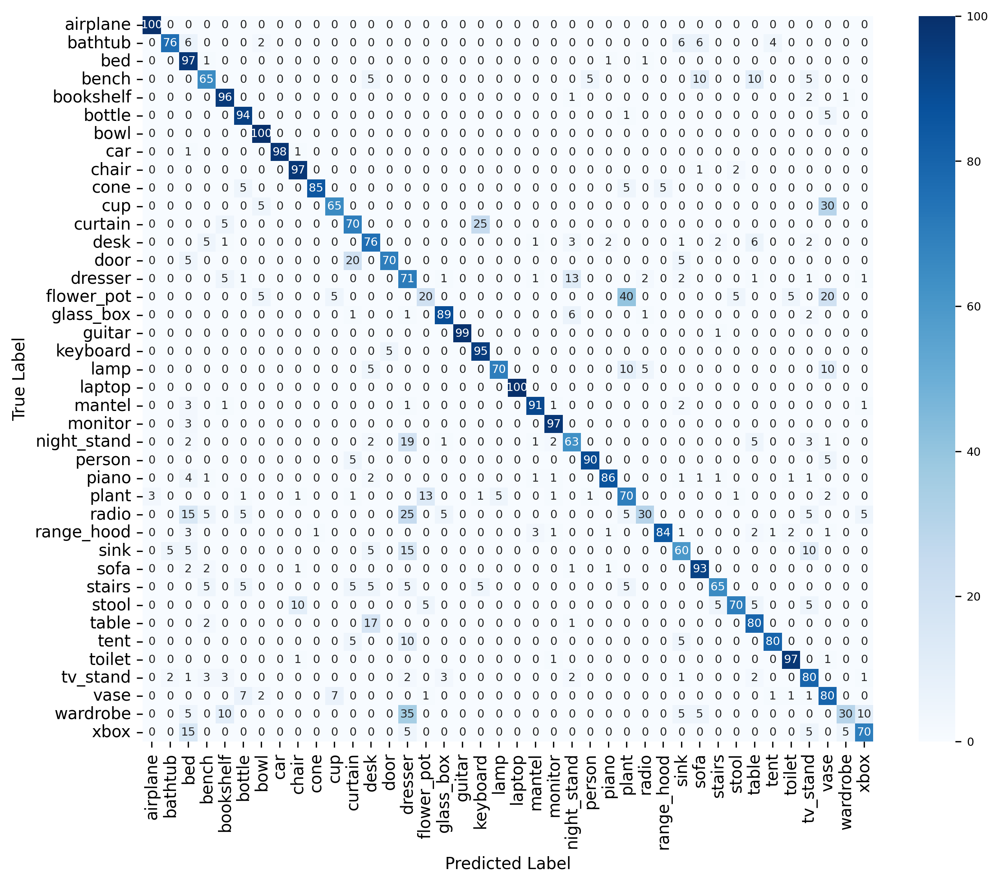

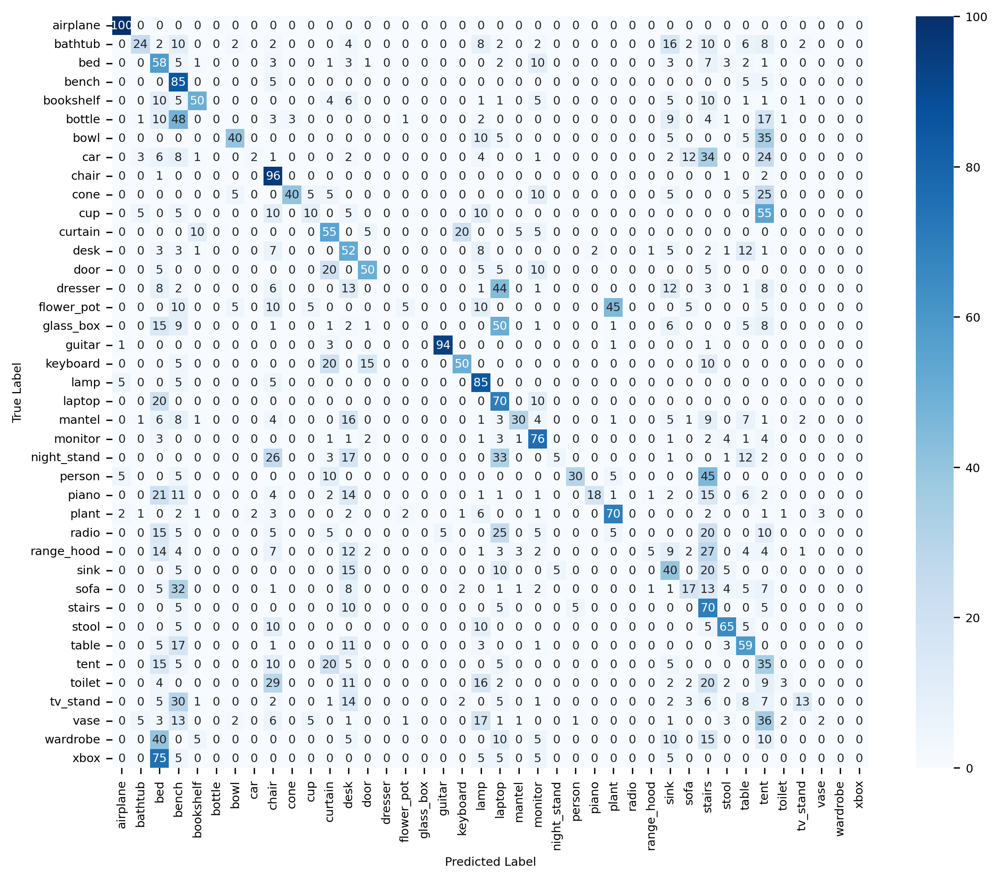

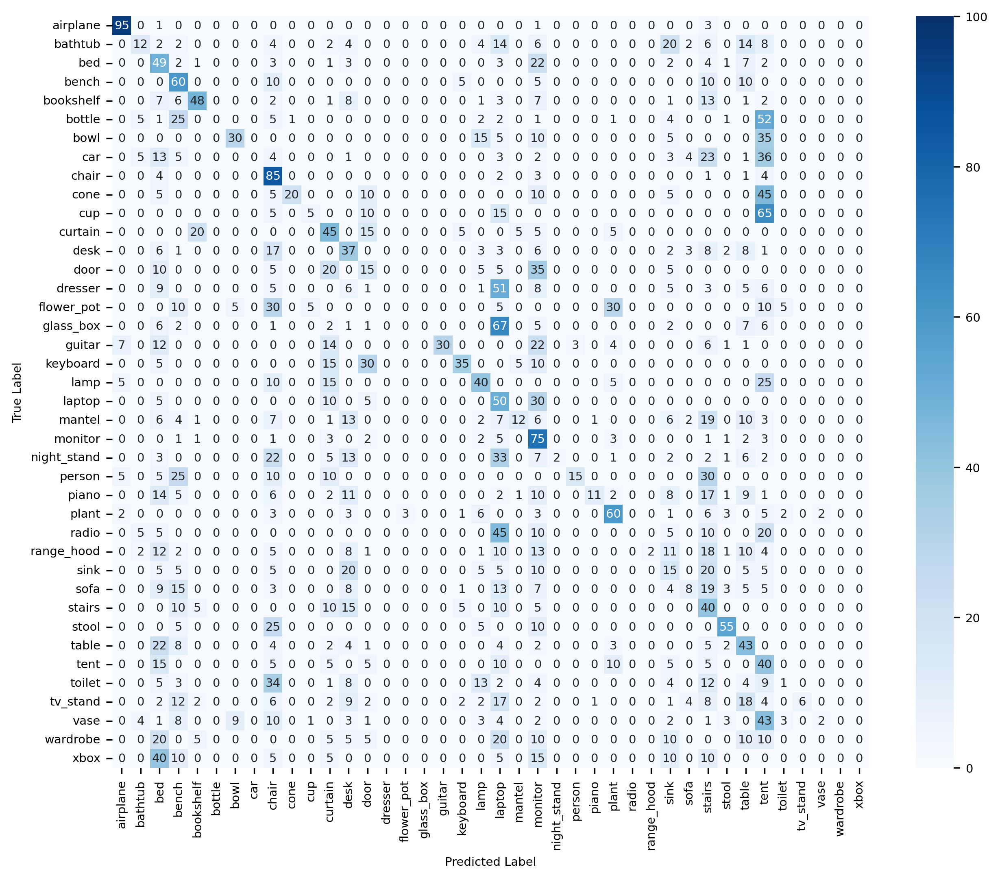

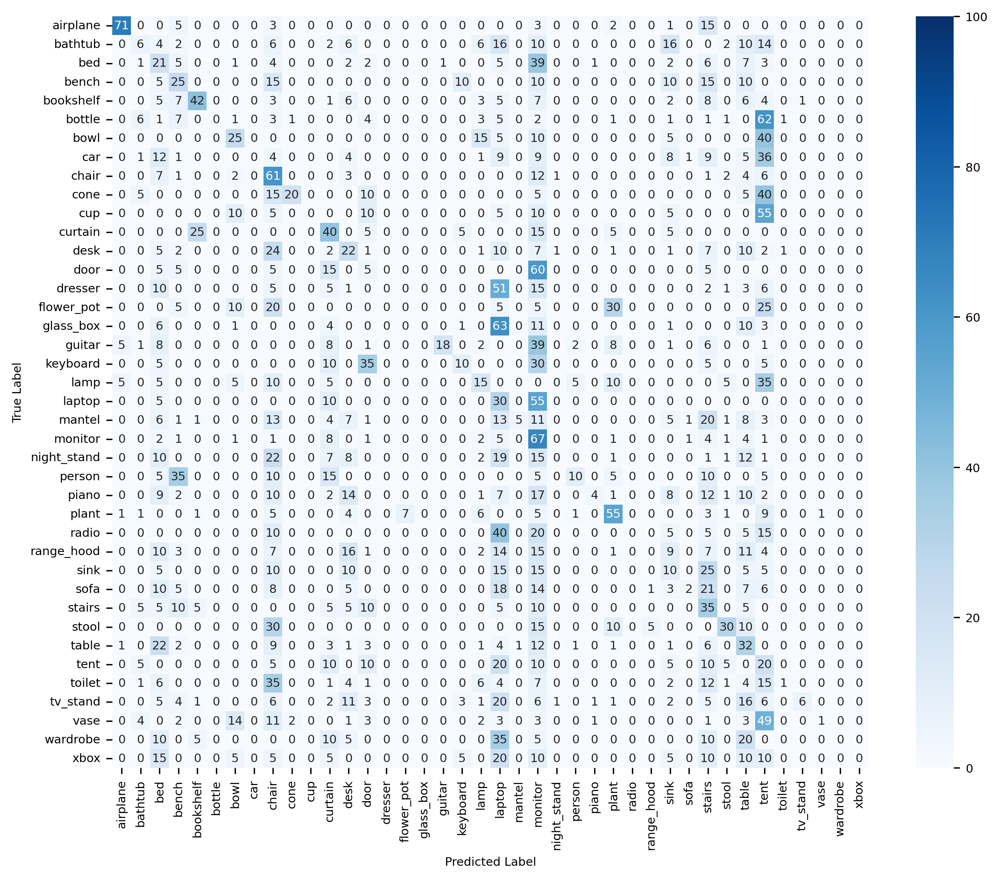

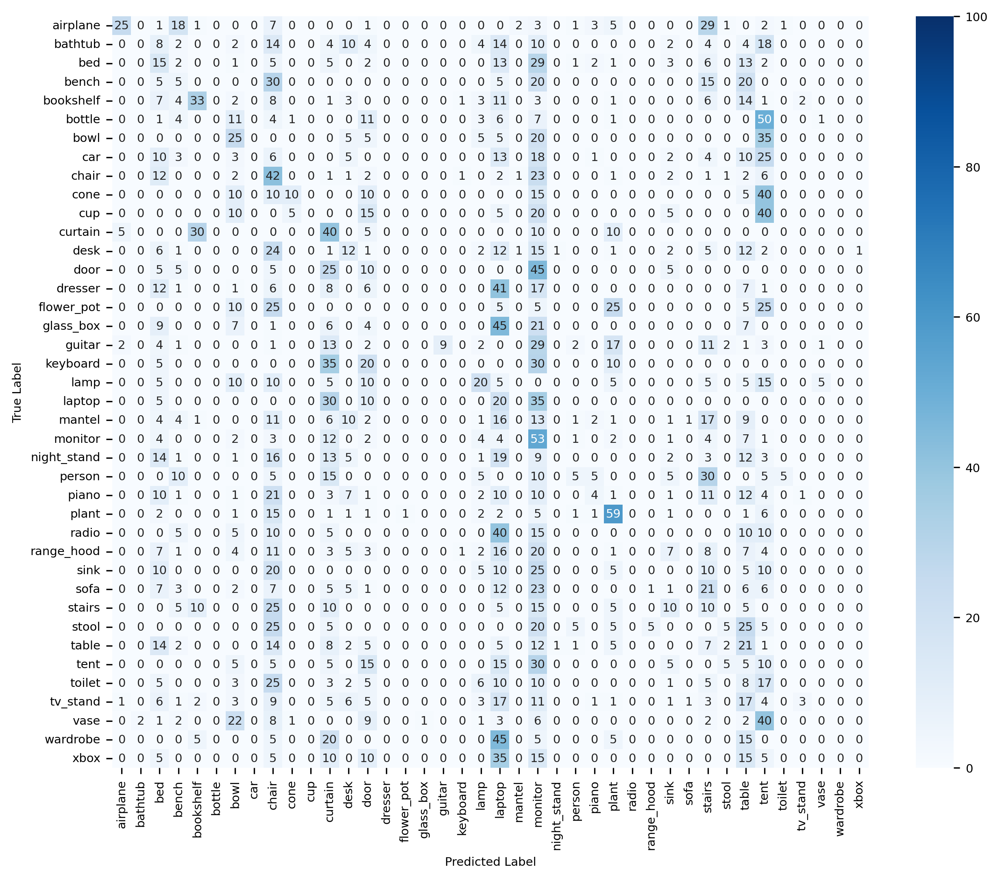

...

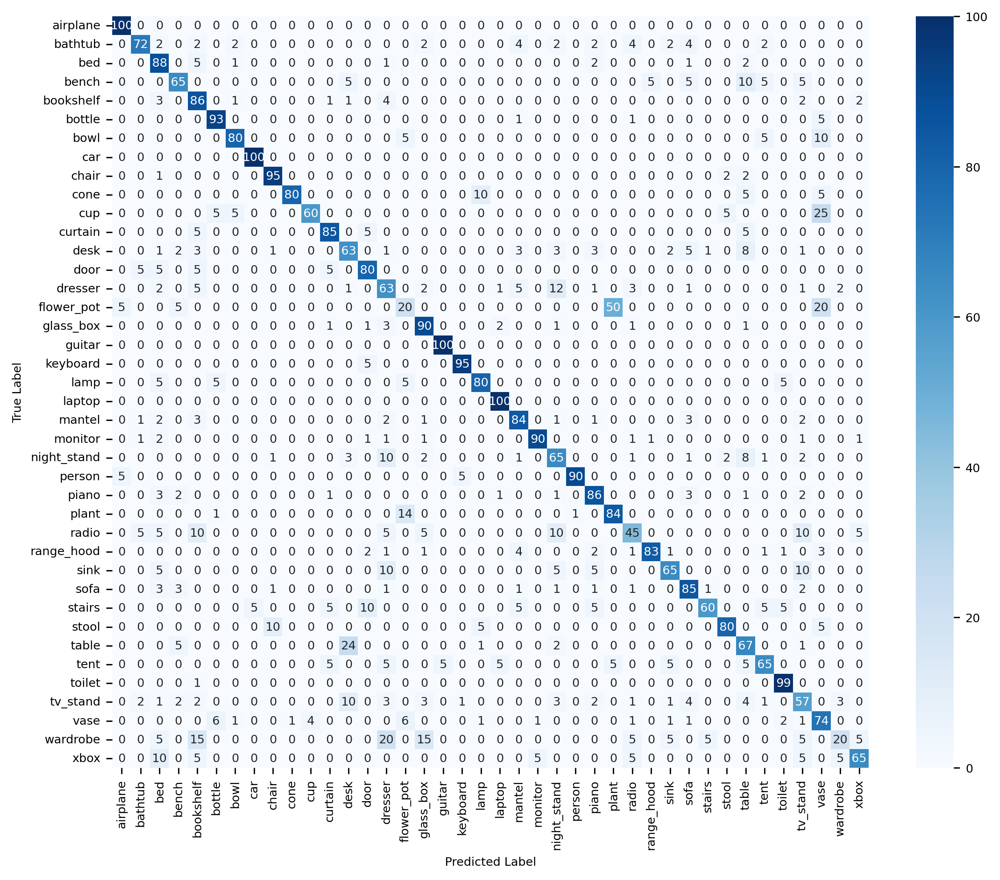

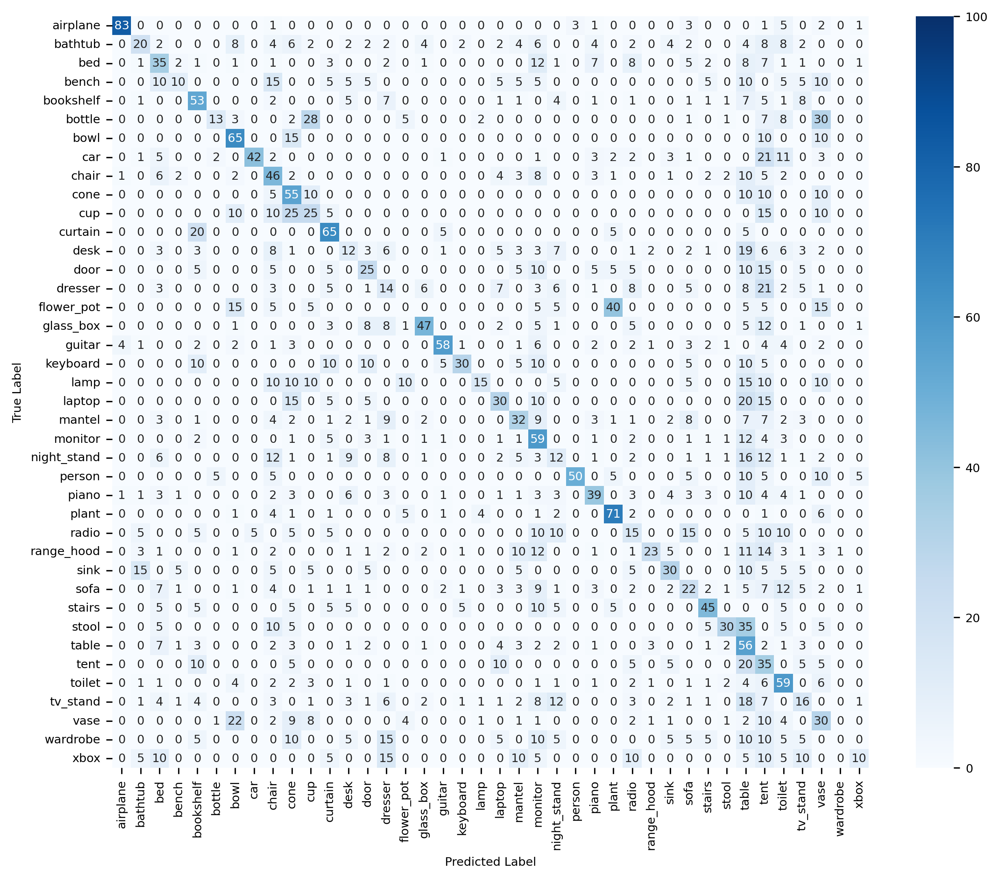

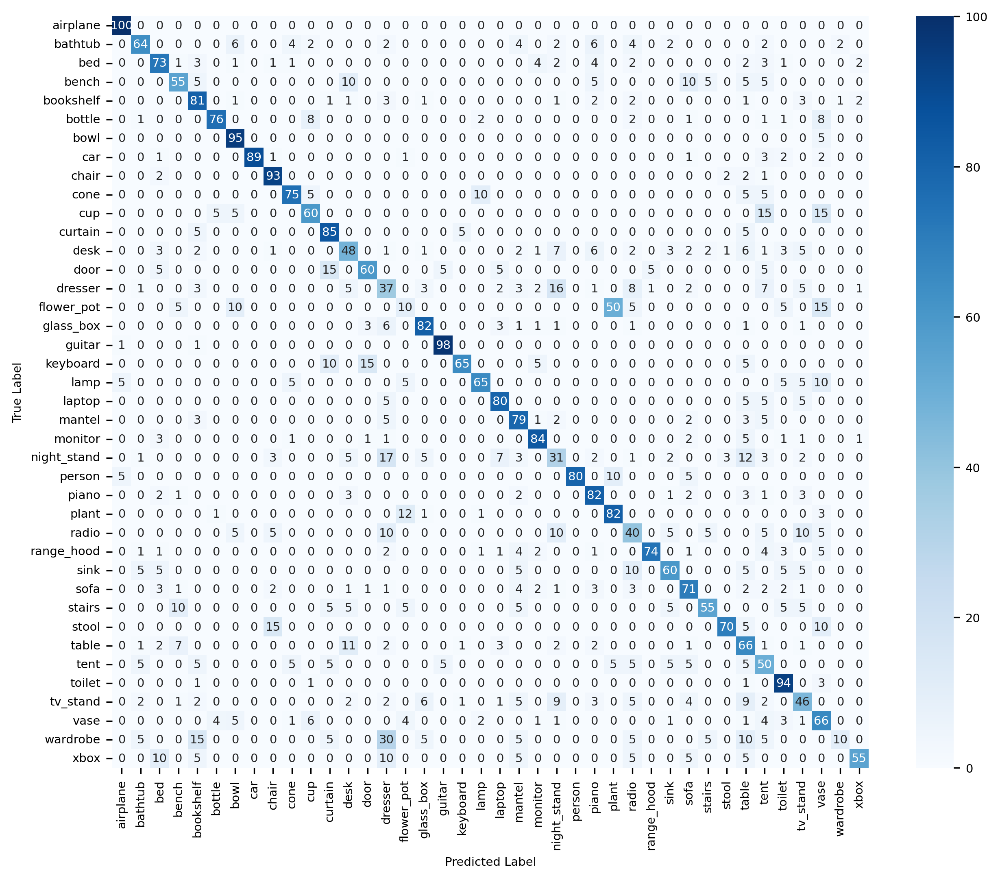

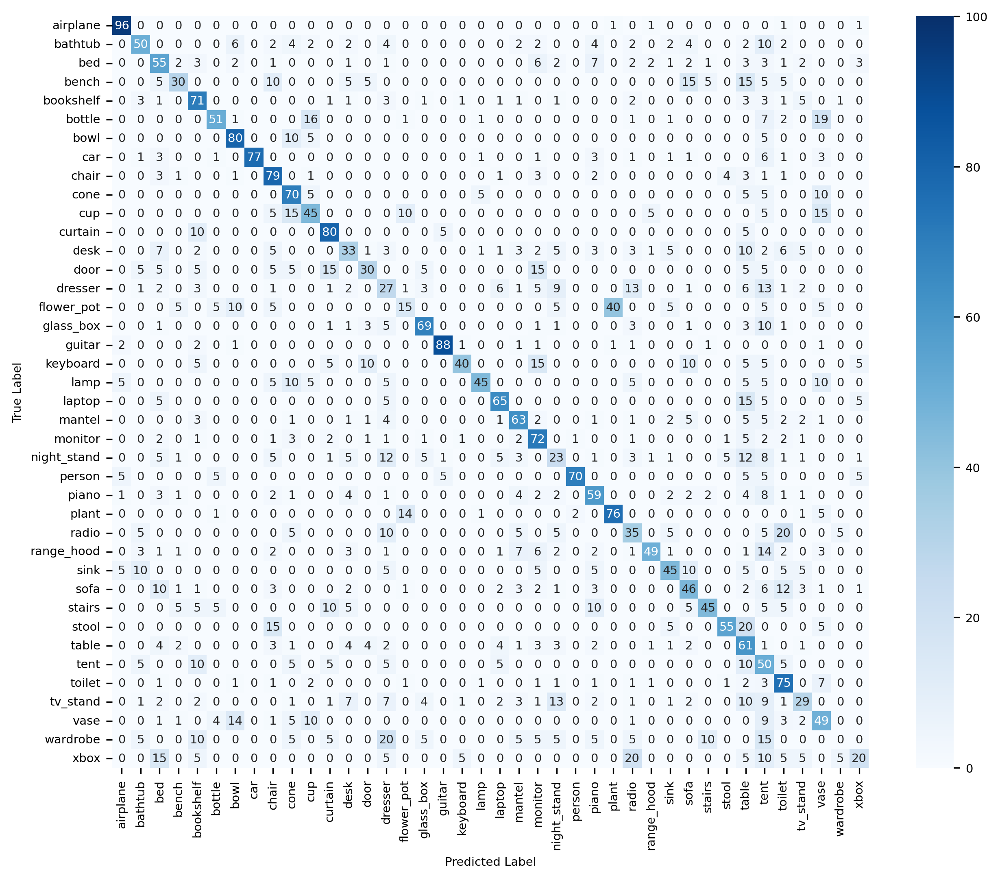

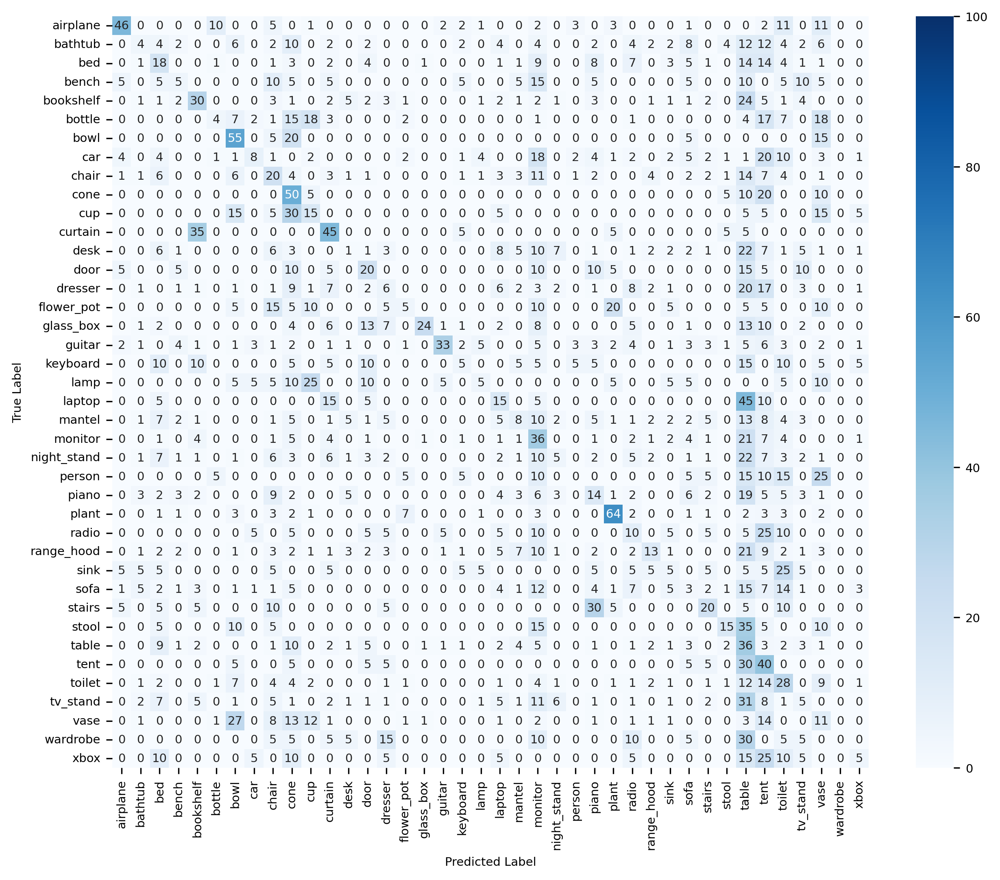

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from sklearn.metrics import confusion_matrix

def make_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred, normalize='true') * 100
    fig, ax = plt.subplots(figsize=(10, 8), dpi=300)
    plt.rcParams.update({'font.size': 7})
    ax = sns.heatmap(
        data=cm,
        annot=True,
        fmt='.0f',
        cmap='Blues',
        xticklabels=class_names.values(),
        yticklabels=class_names.values(),
        ax=ax,
        vmax=100,
        vmin=0
      )
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')
    return fig, ax

# Make the confusion matrix for all results, save to output folder
for _, model, train, test in tqdm(result_configs, desc="Drawing Confusion Matrices"):
    y_true = results[model][train][test]['y_true_cls']
    y_pred = results[model][train][test]['y_pred_cls']

    fig, ax = make_confusion_matrix(y_true, y_pred, class_names)
    fig.savefig(os.path.join(output_path, "cm_papnet", f'cm_{model}_{train}_trained_{test}_tested.png'), bbox_inches='tight')

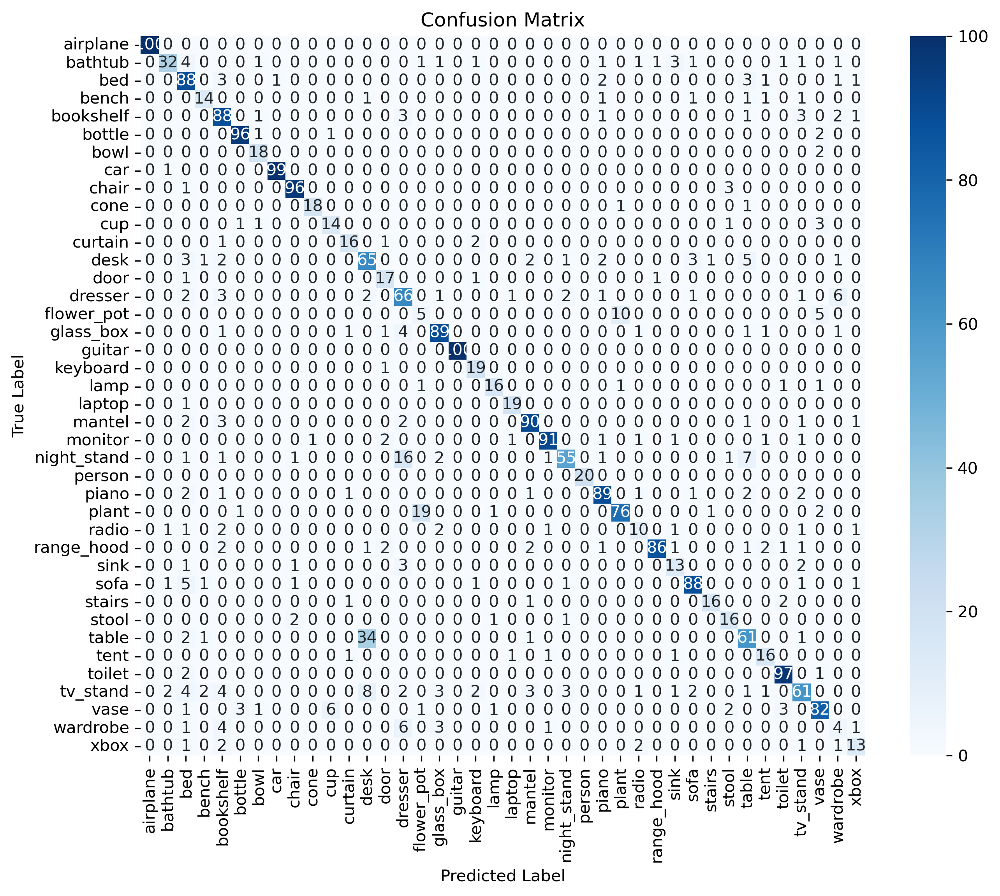

In [ ]:
fig, ax = make_confusion_matrix(result_partialmodel_partialtest[1], result_partialmodel_partialtest[0], class_names)
plt.show()

Drawing Confusion Matrices:  83%|████████▎ | 20/24 [00:09<00:01,  2.79it/s]/tmp/ipython-input-2588020010.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(5, 4), dpi=100)
Drawing Confusion Matrices: 100%|██████████| 24/24 [00:11<00:00,  2.07it/s]


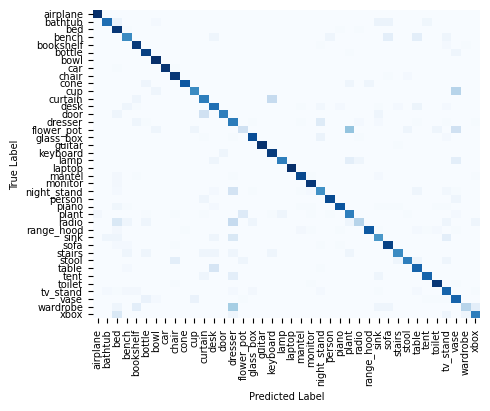

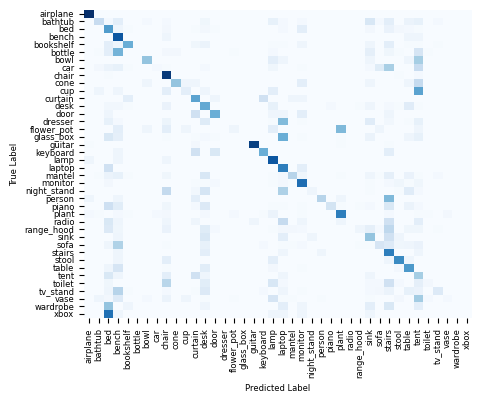

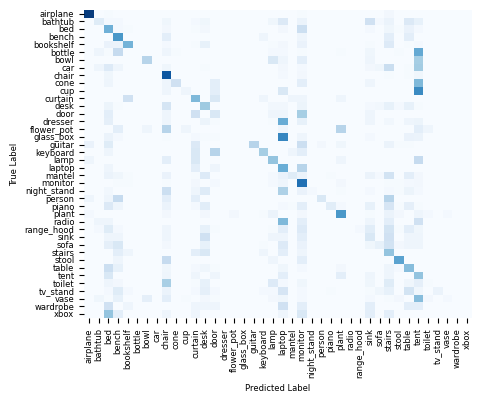

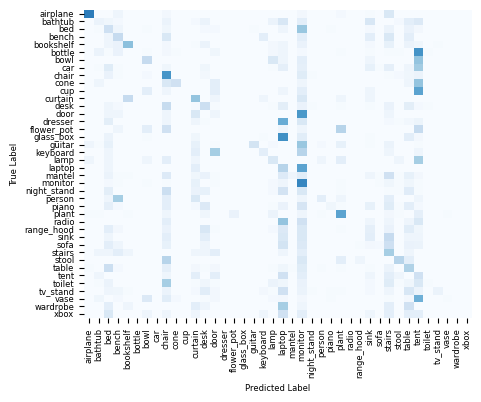

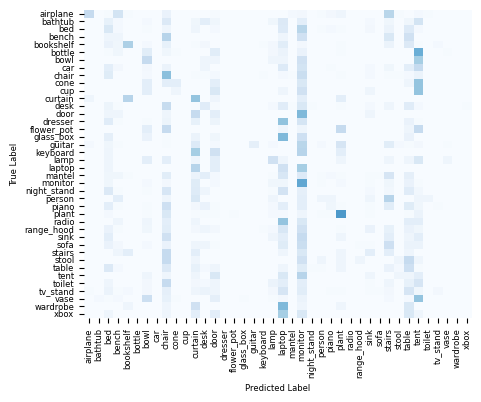

...

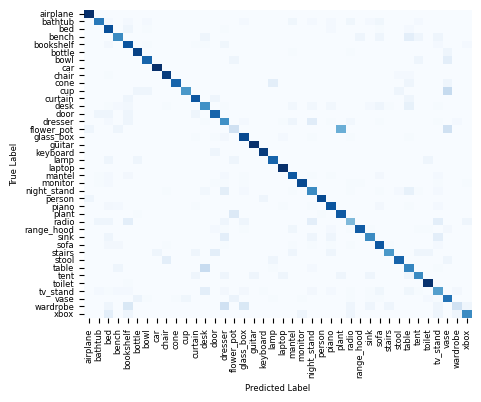

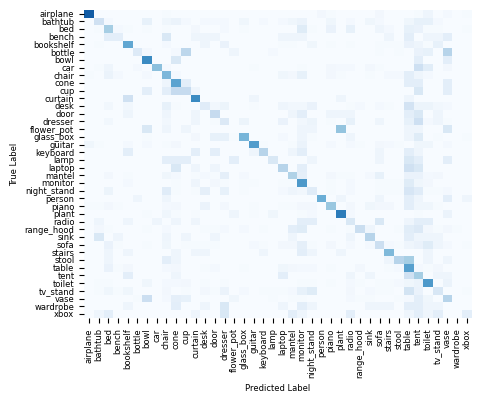

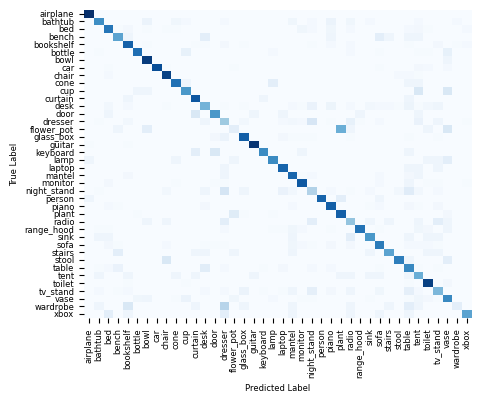

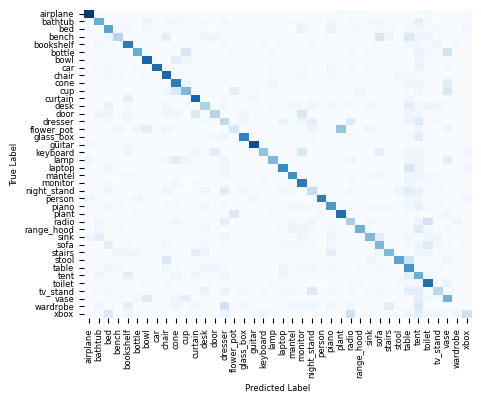

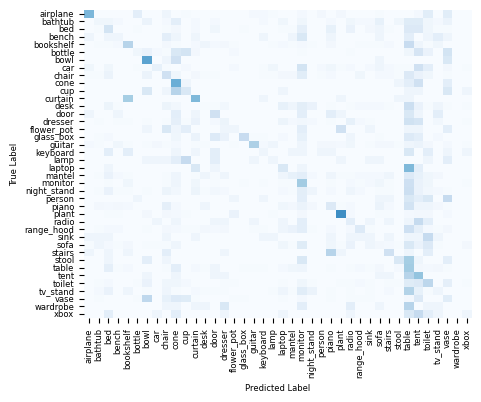

In [31]:
# Small version

def make_confusion_matrix_small(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred, normalize='true') * 100
    fig, ax = plt.subplots(figsize=(5, 4), dpi=100)
    plt.rcParams.update({'font.size': 6})
    ax = sns.heatmap(
        data=cm,
        annot=False,
        fmt='.0f',
        cmap='Blues',
        xticklabels=class_names.values(),
        yticklabels=class_names.values(),
        ax=ax,
        vmax=100,
        vmin=0,
        cbar=False
      )
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')

    return fig, ax

# Make the confusion matrix for all results, save to output folder
for _, model, train, test in tqdm(result_configs, desc="Drawing Confusion Matrices"):
    y_true = results[model][train][test]['y_true_cls']
    y_pred = results[model][train][test]['y_pred_cls']

    fig, ax = make_confusion_matrix_small(y_true, y_pred, class_names)
    fig.savefig(os.path.join(output_path, "cm_papnet", f'cm_{model}_{train}_trained_{test}_tested_small.png'), bbox_inches='tight')